In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
import plotly.express as px
import plotly.figure_factory as ff
import plotly.graph_objects as go
import plotly.io as pio
from sklearn.model_selection import cross_val_predict
from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import StratifiedKFold
from sklearn.metrics import confusion_matrix
from sklearn.metrics import roc_curve
import matplotlib.pyplot as plt
from sklearn.metrics import roc_auc_score

C:\Users\b-jafari.ZARMACARON\AppData\Local\anaconda3\Lib\site-packages\paramiko\transport.py:219: CryptographyDeprecationWarning: Blowfish has been deprecated
  "class": algorithms.Blowfish,


In [2]:
x = [1,2,3]

In [3]:
data = {'x':[1,2,3,6,8,9,2,3,7,5,9],'Y':[4,5,6,4,5,7,9,5,9,2,3]}

In [4]:
m = pd.DataFrame(data)

In [5]:
m

,x,Y
0,1,4
1,2,5
2,3,6
3,6,4
4,8,5
5,9,7
6,2,9
7,3,5
8,7,9
9,5,2


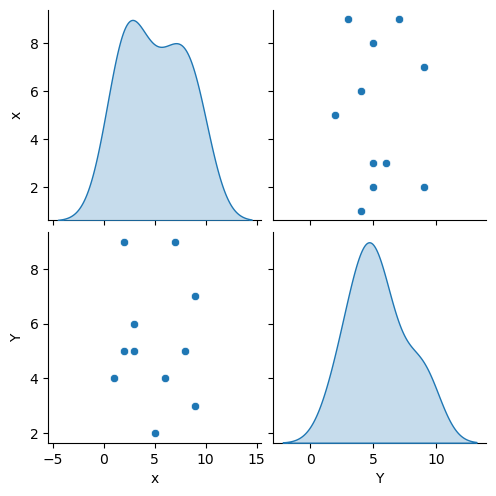

In [6]:
sns.pairplot( m , diag_kind = 'kde' )

 در محور قطری این نمودار نمودار تک متغییره مشاهده میشود که نشان دهنده چگالی هر مقدار می باشد که به آن کی دی ای گفته میشود که اعداد آن بوسیله  توابع کرنل چگالی ساخته می 
 شود
 خروجی آن تابع توزیع هر متغیر است
    

In [7]:
pd.DataFrame({'l':[6,7,8,9],'k':['as','as','s','adg']})

,l,k
0,6,as
1,7,as
2,8,s
3,9,adg


In [8]:
df   = pd.read_csv(r'F:\JAFARI\Mohs\train.csv')
dft  = pd.read_csv(r'F:\JAFARI\Mohs\test.csv')
smpl = pd.read_csv(r'F:\JAFARI\Mohs\sample_submission.csv')

In [9]:
dft=dft.drop("id",axis=True)
df=df.drop("id",axis=True)
df

,allelectrons_Total,density_Total,allelectrons_Average,val_e_Average,atomicweight_Average,ionenergy_Average,el_neg_chi_Average,R_vdw_element_Average,R_cov_element_Average,zaratio_Average,density_Average,Hardness
0,100.0,0.841611,10.000000,4.800000,20.612526,11.088100,2.766000,1.732000,0.860000,0.496070,0.91457,6.0
1,100.0,7.558488,10.000000,4.800000,20.298893,12.040830,2.755000,1.631000,0.910000,0.492719,0.71760,6.5
2,76.0,8.885992,15.600000,5.600000,33.739258,12.086300,2.828000,1.788000,0.864000,0.481478,1.50633,2.5
3,100.0,8.795296,10.000000,4.800000,20.213349,10.948500,2.648000,1.626000,0.936000,0.489272,0.78937,6.0
4,116.0,9.577996,11.600000,4.800000,24.988133,11.824480,2.766000,1.682000,0.896000,0.492736,1.86481,6.0
...,...,...,...,...,...,...,...,...,...,...,...,...
10402,128.0,7.558488,12.000000,4.000000,26.385218,11.330440,2.644000,1.631000,0.892000,0.496070,1.79607,4.0
10403,30.0,1.743160,10.000000,5.333333,20.766935,14.163933,3.090000,1.556667,0.866667,0.480390,0.81480,5.0
10404,196.0,30.920000,24.500000,5.500000,53.490297,10.074300,2.295000,1.545000,1.120000,0.469715,2.11540,1.8
10405,38.0,1.553160,12.666667,4.666667,26.621687,11.290033,2.743333,1.756667,0.980000,0.486507,0.77755,6.0


In [10]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
allelectrons_Total,10407.0,128.053516,224.123776,0.0,68.000000,100.000000,131.000000,15300.000000
density_Total,10407.0,14.491342,15.972877,0.0,7.558488,10.650000,16.676996,643.093804
allelectrons_Average,10407.0,17.033222,10.468734,0.0,10.000000,12.600000,22.000000,67.000000
val_e_Average,10407.0,4.546789,0.690864,0.0,4.000000,4.714286,4.800000,6.000000
atomicweight_Average,10407.0,37.507703,26.012313,0.0,20.298893,26.203827,48.719500,167.400000
ionenergy_Average,10407.0,10.938308,1.408276,0.0,10.590660,11.202760,11.670725,15.245810
el_neg_chi_Average,10407.0,2.607662,0.334906,0.0,2.530000,2.706000,2.805000,3.443000
R_vdw_element_Average,10407.0,1.731330,0.192481,0.0,1.672500,1.732727,1.800000,2.250000
R_cov_element_Average,10407.0,0.944132,0.180017,0.0,0.864000,0.915556,0.981667,1.615840
zaratio_Average,10407.0,0.493349,0.063080,0.0,0.476196,0.488550,0.496070,0.825990


In [11]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10407 entries, 0 to 10406
Data columns (total 12 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   allelectrons_Total     10407 non-null  float64
 1   density_Total          10407 non-null  float64
 2   allelectrons_Average   10407 non-null  float64
 3   val_e_Average          10407 non-null  float64
 4   atomicweight_Average   10407 non-null  float64
 5   ionenergy_Average      10407 non-null  float64
 6   el_neg_chi_Average     10407 non-null  float64
 7   R_vdw_element_Average  10407 non-null  float64
 8   R_cov_element_Average  10407 non-null  float64
 9   zaratio_Average        10407 non-null  float64
 10  density_Average        10407 non-null  float64
 11  Hardness               10407 non-null  float64
dtypes: float64(12)
memory usage: 975.8 KB


In [12]:
 pd.set_option("display.max_rows",20)

In [13]:
pd.set_option('display.float_format','{:.5f}'.format)

In [14]:
dft.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6939 entries, 0 to 6938
Data columns (total 11 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   allelectrons_Total     6939 non-null   float64
 1   density_Total          6939 non-null   float64
 2   allelectrons_Average   6939 non-null   float64
 3   val_e_Average          6939 non-null   float64
 4   atomicweight_Average   6939 non-null   float64
 5   ionenergy_Average      6939 non-null   float64
 6   el_neg_chi_Average     6939 non-null   float64
 7   R_vdw_element_Average  6939 non-null   float64
 8   R_cov_element_Average  6939 non-null   float64
 9   zaratio_Average        6939 non-null   float64
 10  density_Average        6939 non-null   float64
dtypes: float64(11)
memory usage: 596.4 KB


In [15]:
dft.describe().T

,count,mean,std,min,25%,50%,75%,max
allelectrons_Total,6939.00000,126.46013,207.56450,0.00000,68.00000,100.00000,128.00000,10116.00000
density_Total,6939.00000,14.79402,18.98245,0.00000,7.55849,10.65000,16.60133,643.09380
allelectrons_Average,6939.00000,17.40619,10.99609,0.00000,10.00000,12.66667,22.00000,67.00000
val_e_Average,6939.00000,4.54685,0.68316,0.00000,4.00000,4.75000,4.80000,6.00000
atomicweight_Average,6939.00000,38.42279,27.34435,0.00000,20.29889,26.20383,48.71950,167.40000
ionenergy_Average,6939.00000,10.92151,1.37898,0.00000,10.58431,11.20276,11.64556,15.24581
el_neg_chi_Average,6939.00000,2.60812,0.32287,0.00000,2.52750,2.70600,2.80667,3.44300
R_vdw_element_Average,6939.00000,1.73791,0.19058,0.00000,1.67800,1.73600,1.82000,2.25000
R_cov_element_Average,6939.00000,0.94964,0.17927,0.00000,0.86667,0.92000,0.99000,1.61533
zaratio_Average,6939.00000,0.49167,0.06083,0.00000,0.47609,0.48855,0.49612,0.82599


allelectrons_Total
density_Total


به نظر میاد اوتلایر دارند 

و اینکه دیتای ترین و تست شبیه به هم هستند

این نمودار شامل نمودارهای پراکندگی (Scatter Plots) برای هر جفت از متغیرها در مجموعه داده است و به کمک آن می‌توان روابط و توزیع‌های بین متغیرها را مشاهده کرد. در محور قطری (diagonal)، که شامل نمودارهای تک‌متغیره برای هر متغیر است، از توابع کرنل چگالی (Kernel Density Estimation یا KDE) برای نمایش توزیع متغیرها استفاده می‌شود.

کاربرد خروجی نمودار
تجسم روابط بین متغیرها: می‌توان فهمید که کدام متغیرها به هم وابسته‌اند یا به چه شکلی به هم مرتبط هستند (مثل روابط خطی، غیرخطی، یا پراکنده).
شناسایی خوشه‌ها: اگر در داده‌ها خوشه‌هایی وجود داشته باشد، نمودار جفتی می‌تواند به شناسایی و تشخیص آن‌ها کمک کند.
تشخیص نقاط پرت: نمودارهای پراکندگی به شناسایی نقاط پرت یا داده‌های خارج از محدوده معمول کمک می‌کنند.
درک توزیع داده‌ها: نمودارهای KDE در قطر، توزیع هر متغیر را نمایش می‌دهند و به درک بهتر از شکل توزیع (نرمال، چندگانه، و غیره) کمک می‌کنند.
KDE یعنی چه؟
KDE یا Kernel Density Estimation یک روش برای تخمین تابع چگالی احتمال (Probability Density Function) یک متغیر تصادفی است. به بیان ساده، KDE یک روش غیرپارامتری برای تخمین توزیع احتمال داده‌هاست. این روش برای ترسیم چگالی متغیرها بر اساس داده‌های نمونه‌ای که داریم استفاده می‌شود و به جای استفاده از هیستوگرام، یک منحنی صاف‌تر و پیوسته‌تر از چگالی داده‌ها را به تصویر می‌کشد.

مثال ساده از KDE
فرض کنید داده‌های ما تعدادی نقاط در یک بعد هستند، به جای اینکه هیستوگرام این نقاط را رسم کنیم، از KDE استفاده می‌کنیم تا چگالی احتمال نقاط را به صورت یک منحنی پیوسته نمایش دهیم. این منحنی می‌تواند به ما نشان دهد که در چه نواحی از محور داده‌ها، تراکم نقاط بیشتر است و چه توزیعی دارد.

در کل، دستور sns.pairplot(df, diag_kind='kde') به ما کمک می‌کند تا یک نمای کلی از روابط و توزیع‌های موجود در داده‌هایمان داشته باشیم.

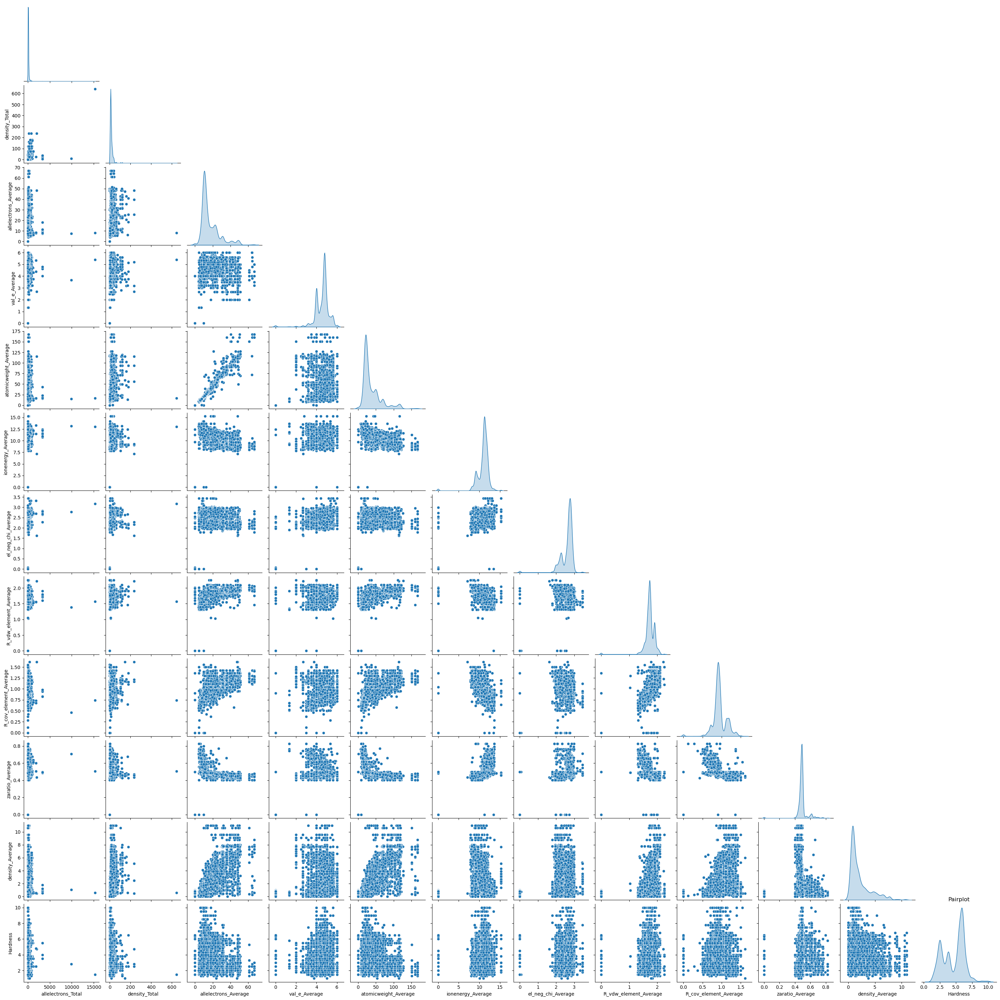

In [16]:
sns.pairplot(df, diag_kind='kde',corner=True)
plt.title("Pairplot")
plt.show()

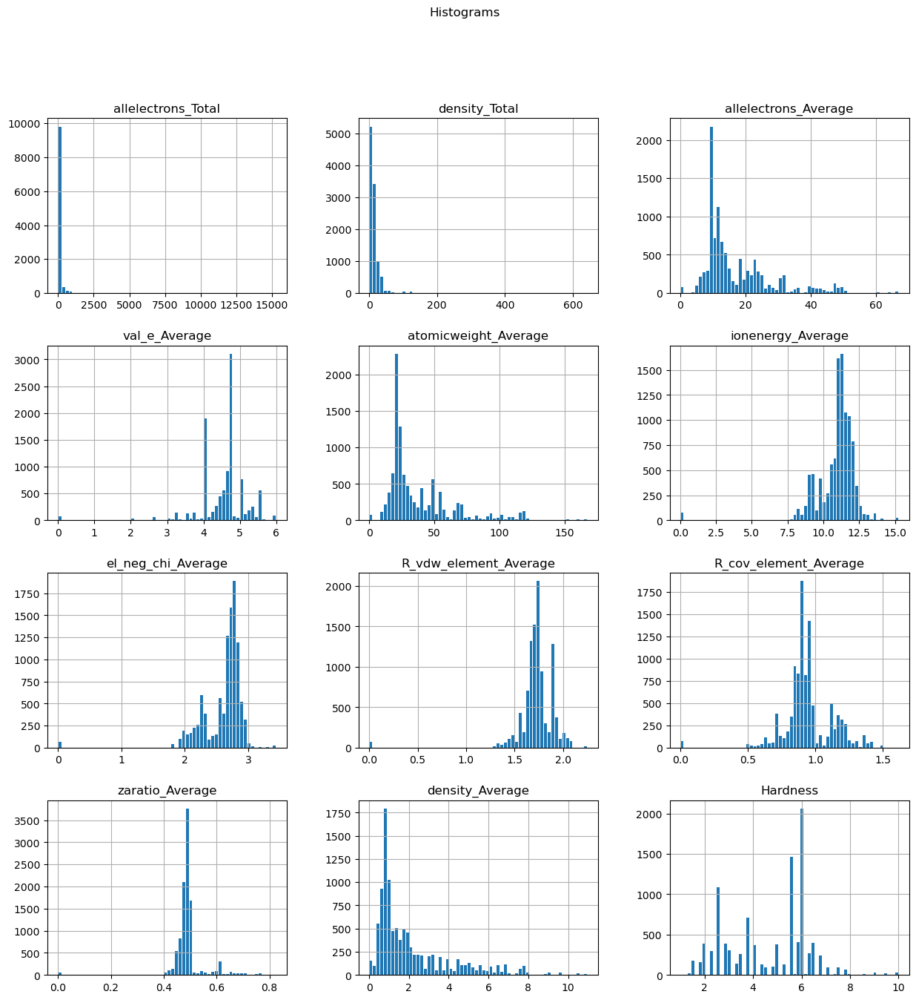

In [17]:
df.hist(figsize=(15,15),bins=60,rwidth=0.8)
plt.suptitle("Histograms")
plt.show()

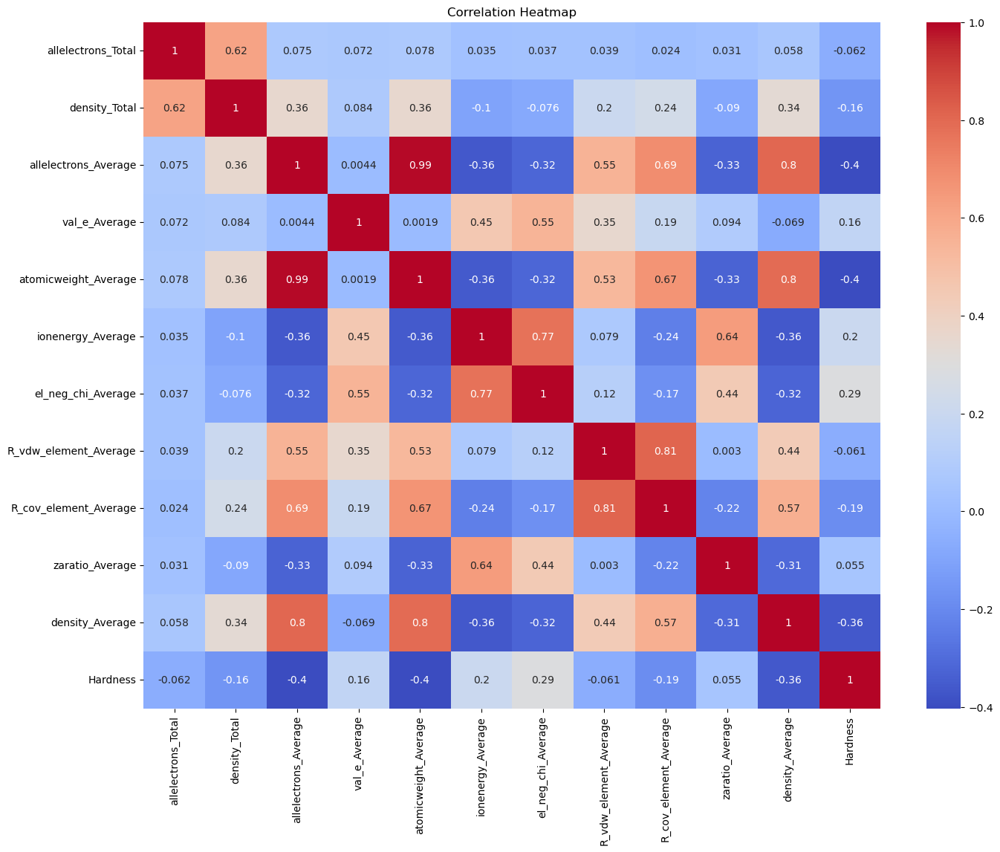

In [18]:
plt.figure(figsize=(16, 12))
sns.heatmap(df.corr(), annot=True, cmap='coolwarm')
plt.title('Correlation Heatmap')
plt.show()

In [19]:
fig = px.histogram(
    df,
    x="Hardness",
    histnorm="probability",
    marginal="box",
    height=460,
    title="Distribution of Hardness - Target Variable<br>"
    "<span style='font-size: 75%; font-weight: bold;'>"
    "This feature seems like a quantized one (many repetitive values)</span>",
)
fig.update_yaxes(title="Probability", row=1)


In [20]:
df.nunique()

allelectrons_Total        325
density_Total            1099
allelectrons_Average      629
val_e_Average             205
atomicweight_Average      849
ionenergy_Average         898
el_neg_chi_Average        745
R_vdw_element_Average     737
R_cov_element_Average     698
zaratio_Average           815
density_Average           599
Hardness                   50
dtype: int64

In [21]:
dft.nunique()

allelectrons_Total       263
density_Total            904
allelectrons_Average     514
val_e_Average            185
atomicweight_Average     728
ionenergy_Average        699
el_neg_chi_Average       643
R_vdw_element_Average    622
R_cov_element_Average    592
zaratio_Average          660
density_Average          598
dtype: int64

In [22]:
train_av = df.drop("Hardness", axis=1).assign(AV=0)
test_av = dft.assign(AV=1)

data_av = pd.concat((train_av, test_av), ignore_index=True)
data_av = data_av.sample(frac=1.0, random_state=42)

X = data_av.drop("AV", axis=1)   #.drop("id",axis=1) #این ستون و حذف نکرده بودی 6 ماه درگیر بودی
y = data_av.AV

y_proba = cross_val_predict(
    estimator=make_pipeline(StandardScaler(), LogisticRegression(random_state=42)),
    X=X,
    y=y,
    cv=StratifiedKFold(n_splits=5, shuffle=True, random_state=19937),
    method="predict_proba"
)


av_scores = {
    "ConfusionMatrix": confusion_matrix(y, y_proba.argmax(axis=1)),
    "FPR-TPR-Threshold": roc_curve(y, y_proba[:, 1]),
    "ROC-AUC": roc_auc_score(y, y_proba[:, 1])}


**Confusion Matrix:** This is a table that is often used to describe the performance of a classification model on a set of test data for which the true values are known. It presents counts of true positive, true negative, false positive, and false negative predictions made by the classifier.


**FPR-TPR-Threshold:** This represents the Receiver Operating Characteristic (ROC) curve, which is a graphical plot that illustrates the diagnostic ability of a binary classifier system as its discrimination threshold is varied. It shows the trade-off between true positive rate (TPR) and false positive rate (FPR) as the threshold changes.


**ROC-AUC:** The Area Under the ROC Curve (ROC AUC) is a single scalar value that represents the area under the ROC curve. It provides an aggregate measure of performance across all possible classification thresholds.


In [23]:
y_proba

array([[0.59374096, 0.40625904],
       [0.59403155, 0.40596845],
       [0.59439986, 0.40560014],
       ...,
       [0.57306058, 0.42693942],
       [0.59379365, 0.40620635],
       [0.59779406, 0.40220594]])

In [24]:
a = pd.DataFrame ({"FPR":roc_curve(y, y_proba[:,1])[0],"TPR":roc_curve(y, y_proba[:, 1])[1],"Thresholds":roc_curve(y, y_proba[:, 1])[2]})
a.sort_values("Thresholds")

,FPR,TPR,Thresholds
8302,1.00000,1.00000,0.23219
8301,0.99990,1.00000,0.25864
8300,0.99990,0.99957,0.27091
8299,0.99981,0.99957,0.27413
8298,0.99981,0.99942,0.28350
...,...,...,...
4,0.00048,0.00029,0.50640
3,0.00038,0.00029,0.52341
2,0.00038,0.00014,0.54330
1,0.00000,0.00014,0.65288


In [25]:
roc_auc_score(y, y_proba[:, 1]),

(0.5036721946535343,)

In [26]:
confusion_matrix(y, y_proba.argmax(axis=1))

array([[10396,    11],
       [ 6936,     3]], dtype=int64)

Confusion Matrix:
[[10396    11]
 [ 6936     3]]


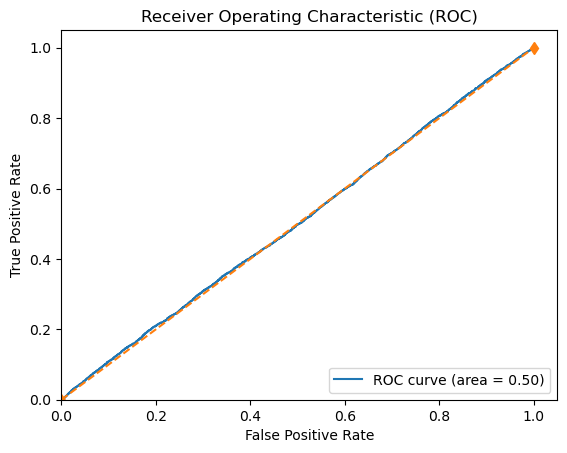

ROC-AUC Score: 0.50367219


In [27]:

# Print the confusion matrix
print("Confusion Matrix:")
print(av_scores["ConfusionMatrix"])

# Plot the ROC curve
fpr, tpr, thresholds = av_scores["FPR-TPR-Threshold"]
plt.figure()
plt.plot(fpr, tpr, label=f'ROC curve (area = {av_scores["ROC-AUC"]:.2f})')
plt.plot([0, 1], [0, 1], 'd--')  # Diagonal line
plt.xlim([0.0, 1.05])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC)')
plt.legend(loc="lower right")
plt.show()

# Print the ROC-AUC score
print(f"ROC-AUC Score: {av_scores['ROC-AUC']:.8f}")

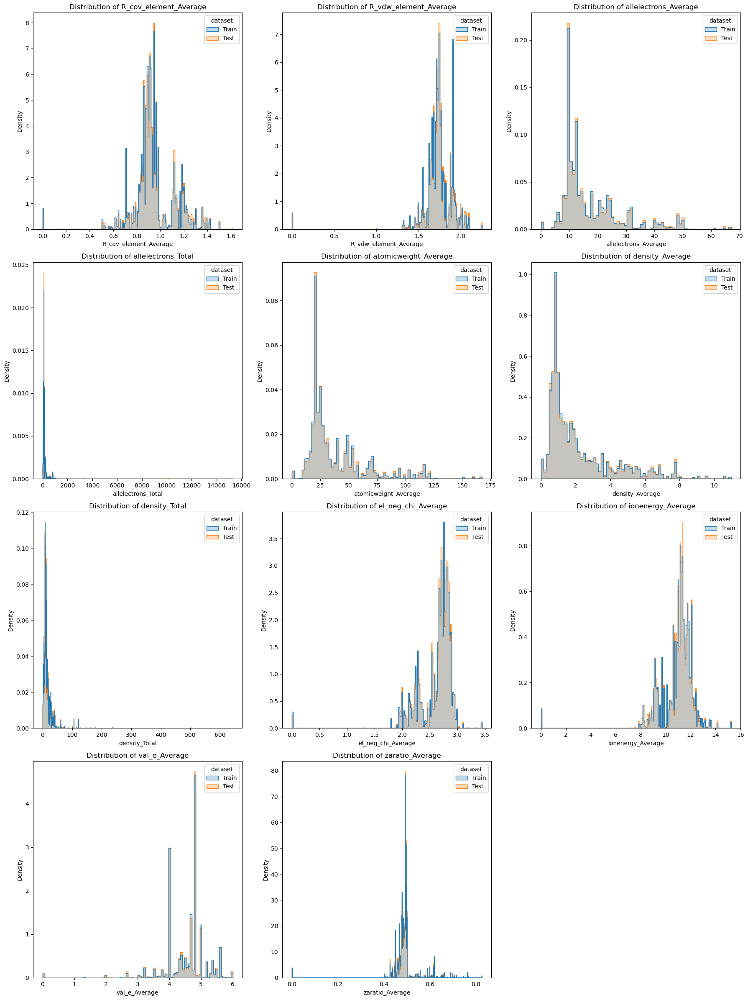

In [28]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd



# ایجاد یک دیتا فریم مشترک برای هر دو گروه
df['dataset'] = 'Train'
dft['dataset'] = 'Test'

combined = pd.concat([df, dft])
combined = combined.drop('Hardness',axis=True)
features = combined.columns.difference(['dataset'])



# تنظیم نمودارها
n_cols = 3
n_rows = (len(features) + n_cols - 1) // n_cols
fig, axes = plt.subplots(n_rows, n_cols, figsize=(18, 6 * n_rows))
axes = axes.flatten()

# رسم نمودار برای هر ویژگی
for i, feature in enumerate(features):
    sns.histplot(data=combined, x=feature, hue='dataset', element='step', stat='density', common_norm=False, ax=axes[i])
    axes[i].set_title(f'Distribution of {feature}')
    axes[i].set_xlabel(feature)
    axes[i].set_ylabel('Density')

# حذف محورها اضافی
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.show()


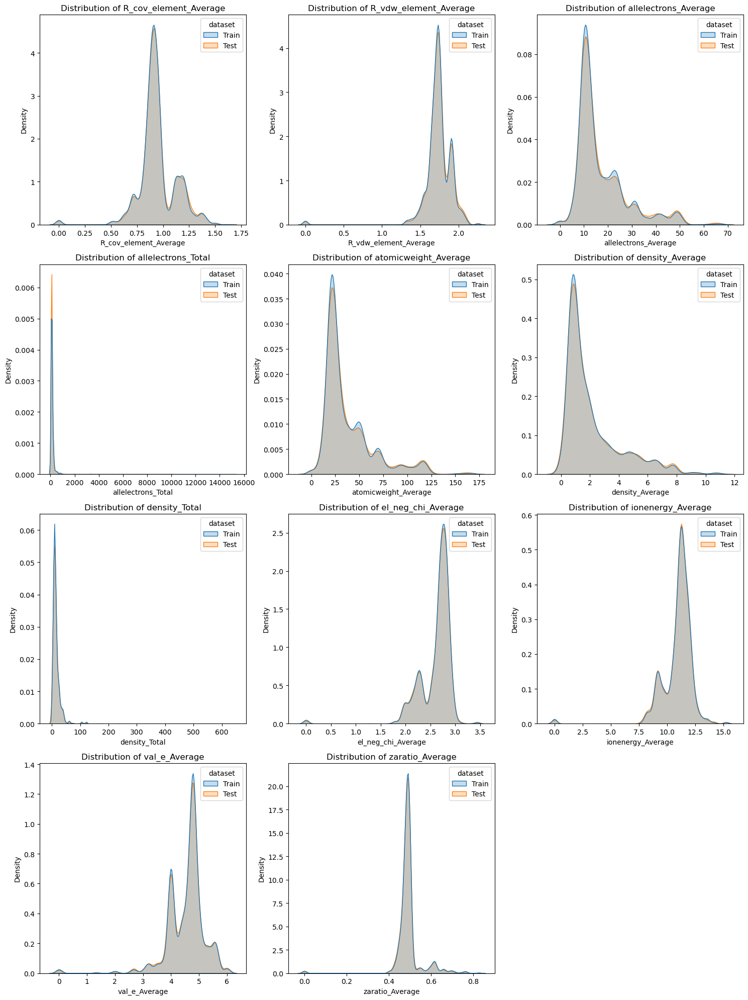

In [29]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd





# اضافه کردن ستون dataset به DataFrame‌ها
df['dataset'] = 'Train'
dft['dataset'] = 'Test'

# ترکیب DataFrame‌ها
combined = pd.concat([df, dft])
combined = combined.drop('Hardness',axis=True)

# تغییر نوع داده تمام ستون‌ها به float به جز ستون 'dataset'
columns_to_convert = combined.columns.difference(['dataset'])
combined[columns_to_convert] = combined[columns_to_convert].astype(float)

features = combined[columns_to_convert].columns

# تنظیم نمودارها
n_cols = 3
n_rows = (len(features) + n_cols - 1) // n_cols
fig, axes = plt.subplots(n_rows, n_cols, figsize=(15, 5 * n_rows))
axes = axes.flatten()

# رسم نمودار KDE برای هر ویژگی
for i, feature in enumerate(features):
    sns.kdeplot(data=combined, x=feature, hue='dataset', common_norm=False, ax=axes[i], fill=True)
    axes[i].set_title(f'Distribution of {feature}')
    axes[i].set_xlabel(feature)
    axes[i].set_ylabel('Density')

# حذف محورها اضافی
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.show()



***دیتای ترین و تست یک تابع توزیع دارند***

C:\Users\b-jafari.ZARMACARON\AppData\Local\anaconda3\Lib\site-packages\seaborn\matrix.py:530: ClusterWarning:

scipy.cluster: The symmetric non-negative hollow observation matrix looks suspiciously like an uncondensed distance matrix



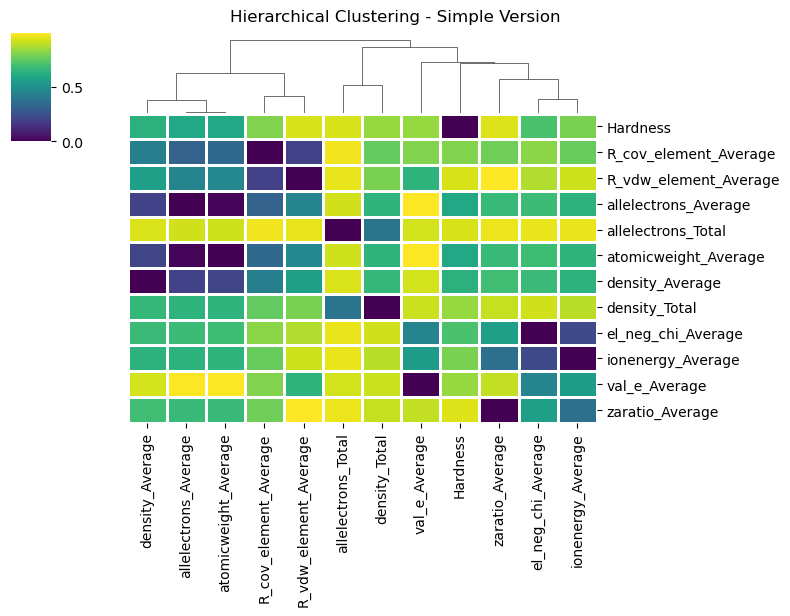

In [30]:
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np

selected_features = df.columns.difference(['dataset'])

pearson_corr = df.drop('dataset',axis=True).corr()

pearson_corr_subset = pearson_corr.loc[selected_features, selected_features]

dissimilarity = 1 - np.abs(pearson_corr_subset)

clustermap = sns.clustermap(
    dissimilarity, 
    method='complete', 
    cmap='viridis', 
    linewidths=.75, 
    figsize=(8, 6),
    row_cluster=False
)


plt.suptitle("Hierarchical Clustering - Simple Version", y=1.02)

plt.show()


single: این روش به عنوان "کمینه فاصله ی کمتر" شناخته می‌شود و در هر مرحله، دو خوشه با کمترین فاصله بین نقاط آن‌ها ادغام می‌شوند.
complete: این روش به عنوان "کمینه فاصله‌ی بیشتر" شناخته می‌شود و در هر مرحله، دو خوشه با بیشترین فاصله بین نقاط آن‌ها ادغام می‌شوند.
average: این روش متوسط فاصله بین نقاط دو خوشه را در نظر می‌گیرد و بر اساس آن ادغام انجام می‌دهد.
ward:این روش تلاش می‌کند تا به طور معقول خوشه‌ها را ادغام کند تا متغیریت داخلی هر خوشه را کمینه کند.


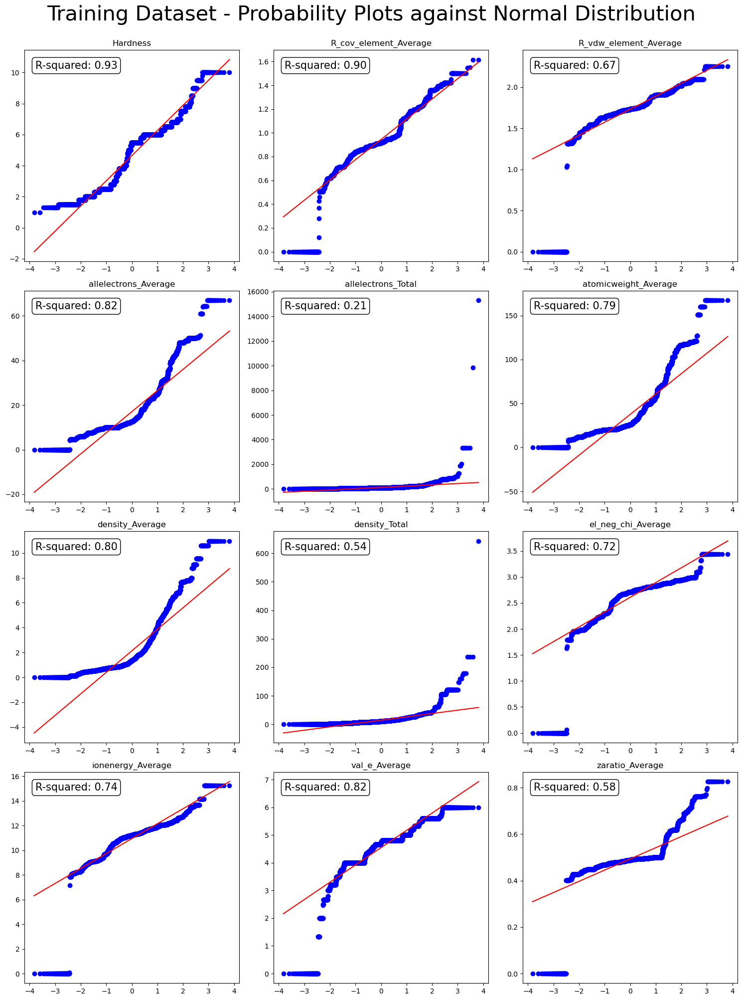

In [31]:
import numpy as np
import matplotlib.pyplot as plt
from scipy import stats

features = df.columns.difference(['dataset'])

n_cols = 3
n_rows = (len(features) + n_cols - 1) // n_cols
fig, axes = plt.subplots(n_rows, n_cols, figsize=(15, 5 * n_rows))
fig.suptitle('Training Dataset - Probability Plots against Normal Distribution', fontsize=30, y=1)  

axes = axes.flatten()


for i, feature in enumerate(features):
    stats.probplot(df[feature], dist="norm", plot=axes[i])
    
    (osm, osr), (_, _, R) = stats.probplot(df[feature], dist="norm")  
    R_squared = R ** 2 
    
    axes[i].annotate(f'R-squared: {R_squared:.2f}', xy=(0.05, 0.95), xycoords='axes fraction', ha='left', va='top', fontsize=15, bbox=dict(boxstyle="round,pad=0.3", fc="white", ec="black", lw=1))  
    axes[i].set_xlabel('')
    axes[i].set_ylabel('')
    axes[i].set_title(feature)
   
    

plt.tight_layout()  
plt.show()


#    axes[i].set_xlabel('Theoretical Quantiles')
#    axes[i].set_ylabel('Ordered Values')

In [32]:
r2_scores = pd.DataFrame(index=("Original", "YeoJohnson", "Log", "Sqrt"))

for feature in features:
    orig = df[feature].dropna()
    _, (*_, R_orig) = stats.probplot(orig, rvalue=True)
    _, (*_, R_yeojohn) = stats.probplot(stats.yeojohnson(orig)[0], rvalue=True)
    _, (*_, R_log) = stats.probplot(np.log1p(orig), rvalue=True)
    _, (*_, R_sqrt) = stats.probplot(np.sqrt(orig), rvalue=True)

    r2_scores[feature] = (
        R_orig * R_orig,
        R_yeojohn * R_yeojohn,
        R_log * R_log,
        R_sqrt * R_sqrt,
    )

r2_scores = r2_scores.transpose()
r2_scores["Winner"] = r2_scores.idxmax(axis=1)
r2_scores

,Original,YeoJohnson,Log,Sqrt,Winner
Hardness,0.92672,0.92688,0.90410,0.91704,YeoJohnson
R_cov_element_Average,0.89513,0.91391,0.82629,0.68871,YeoJohnson
R_vdw_element_Average,0.67191,0.94179,0.46522,0.37453,YeoJohnson
allelectrons_Average,0.81741,0.92112,0.90810,0.90305,YeoJohnson
allelectrons_Total,0.21496,0.91865,0.87563,0.77017,YeoJohnson
atomicweight_Average,0.79458,0.91740,0.89083,0.89608,YeoJohnson
density_Average,0.79616,0.96909,0.92960,0.91646,YeoJohnson
density_Total,0.53622,0.97921,0.97876,0.88460,YeoJohnson
el_neg_chi_Average,0.71783,0.92561,0.50335,0.45465,YeoJohnson
ionenergy_Average,0.73698,0.94678,0.34046,0.44773,YeoJohnson


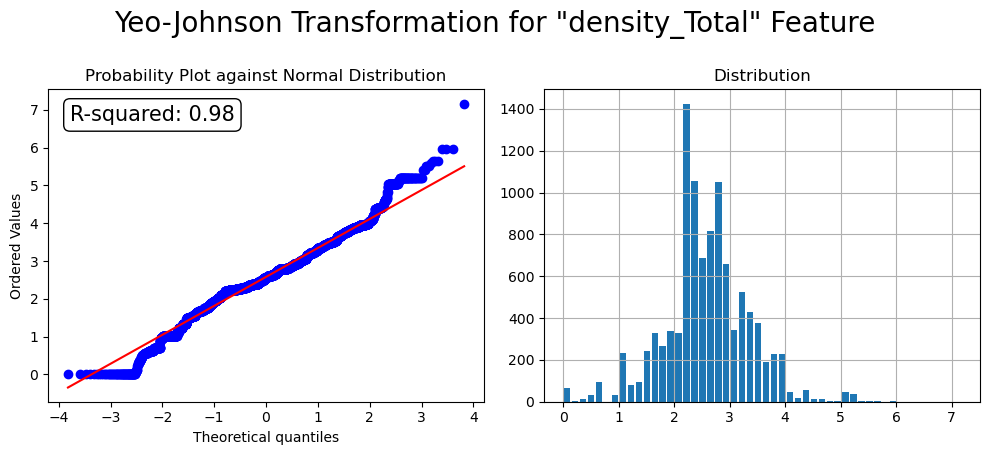

In [33]:
import matplotlib.pyplot as plt
import pandas as pd
import scipy.stats as stats


density_Total_transformed = stats.yeojohnson(df.density_Total.dropna())[0]


# ساخت subplot
fig, axes = plt.subplots(1, 2, figsize=(10, 4.5))
fig.suptitle('Yeo-Johnson Transformation for "density_Total" Feature', fontsize=20, y=1)  
# قیاسی
ax1 = axes[0]
stats.probplot(density_Total_transformed, dist="norm", plot=ax1 )
ax1.set_title('Probability Plot against Normal Distribution')

(osm, osr), (_, _, R) = stats.probplot(density_Total_transformed, dist="norm")  
R_squared = R ** 2 
    
ax1.annotate(f'R-squared: {R_squared:.2f}', xy=(0.05, 0.95), xycoords='axes fraction', ha='left', va='top', fontsize=15, bbox=dict(boxstyle="round,pad=0.3", fc="white", ec="black", lw=1)) 


# هیستوگرام
ax2 = axes[1]
pd.DataFrame(density_Total_transformed).hist(ax=ax2,bins=50,rwidth = 0.8)
ax2.set_title('Distribution')


# ذخیره و نمایش نمودارها
plt.tight_layout()
plt.show()


In [34]:
df

,allelectrons_Total,density_Total,allelectrons_Average,val_e_Average,atomicweight_Average,ionenergy_Average,el_neg_chi_Average,R_vdw_element_Average,R_cov_element_Average,zaratio_Average,density_Average,Hardness,dataset
0,100.00000,0.84161,10.00000,4.80000,20.61253,11.08810,2.76600,1.73200,0.86000,0.49607,0.91457,6.00000,Train
1,100.00000,7.55849,10.00000,4.80000,20.29889,12.04083,2.75500,1.63100,0.91000,0.49272,0.71760,6.50000,Train
2,76.00000,8.88599,15.60000,5.60000,33.73926,12.08630,2.82800,1.78800,0.86400,0.48148,1.50633,2.50000,Train
3,100.00000,8.79530,10.00000,4.80000,20.21335,10.94850,2.64800,1.62600,0.93600,0.48927,0.78937,6.00000,Train
4,116.00000,9.57800,11.60000,4.80000,24.98813,11.82448,2.76600,1.68200,0.89600,0.49274,1.86481,6.00000,Train
...,...,...,...,...,...,...,...,...,...,...,...,...,...
10402,128.00000,7.55849,12.00000,4.00000,26.38522,11.33044,2.64400,1.63100,0.89200,0.49607,1.79607,4.00000,Train
10403,30.00000,1.74316,10.00000,5.33333,20.76694,14.16393,3.09000,1.55667,0.86667,0.48039,0.81480,5.00000,Train
10404,196.00000,30.92000,24.50000,5.50000,53.49030,10.07430,2.29500,1.54500,1.12000,0.46971,2.11540,1.80000,Train
10405,38.00000,1.55316,12.66667,4.66667,26.62169,11.29003,2.74333,1.75667,0.98000,0.48651,0.77755,6.00000,Train


In [35]:
import pandas as pd
from sklearn.tree import DecisionTreeRegressor
from functools import partial



X = df.drop({"Hardness","dataset"}, axis=1)
y = df.Hardness

DefaultDecisionTreeRegressor = partial(
    DecisionTreeRegressor,
    criterion="absolute_error",  # Watch out on learning time complexity.
    random_state=42,
    max_depth=3,
)

tree = DefaultDecisionTreeRegressor().fit(X, y)

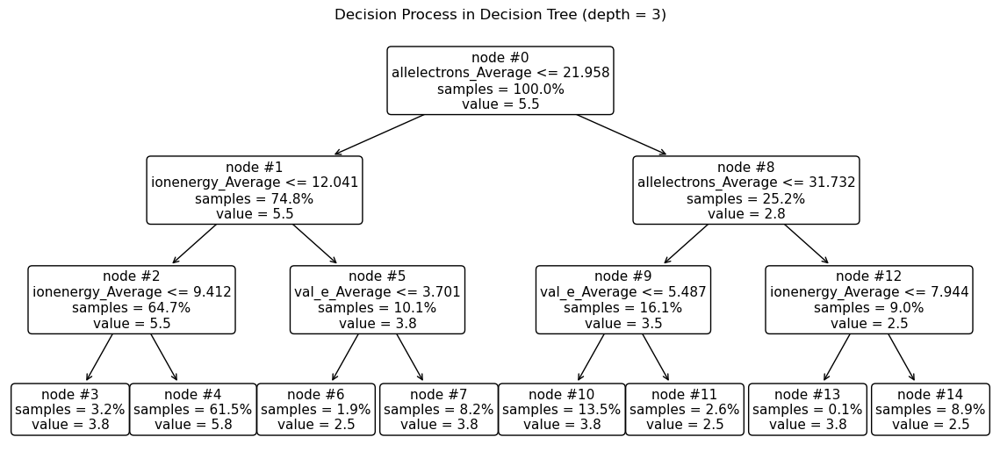

In [36]:
import matplotlib.pyplot as plt
from sklearn.tree import plot_tree
import os

#output_dir = "images"
#os.makedirs(output_dir, exist_ok=True)


plt.figure(figsize=(11.5, 5.5), tight_layout=True)

plot_tree(
    decision_tree=tree,
    feature_names=tree.feature_names_in_.tolist(),  # Feature names used in the tree
    filled=False,       # Do not color the nodes
    rounded=True,       # Draw rounded corners for the nodes
    impurity=False,     # Do not show impurity
    proportion=True,    # Show the proportion of samples in each node
    node_ids=True,      # Display node IDs
    ax=plt.gca(),       # Get the current axes
    fontsize=11,        # Set font size for text
)

plt.title("Decision Process in Decision Tree (depth = 3)")
plt.savefig("images/decision_process_in_tree")
plt.show()

In [37]:
import numpy as np
from sklearn.tree import DecisionTreeRegressor
from sklearn.model_selection import cross_val_score, KFold

# Assuming `X` is your features dataframe and `y` is your target variable.
# Also assuming `tree` is a DecisionTreeRegressor instance.

# You can use a colored string for the print statement
RED = "\033[91m"
RESET = "\033[0m"

for depth in range(2, 7):
    # Set the max depth of the tree
    tree.set_params(max_depth=depth).fit(X, y)
    
    # Identify features used by the tree (ignoring leaves)
    considered_features = tree.tree_.feature[tree.tree_.feature != -2]  # -2 means a leaf
    used_features = np.unique(considered_features)
    used_features = X.columns[used_features].to_list()
    
    # Print the number of features used
    print(f"Features at depth {depth}: {RED}{len(used_features):<5}{RESET}", end="")
    
    # Perform cross-validation
    tree_cv_results = -cross_val_score(
        estimator=tree,
        X=X,
        y=y,
        cv=KFold(n_splits=5, shuffle=True, random_state=42),
        scoring="neg_median_absolute_error",
        n_jobs=2,
    )
    
    # Calculate mean and standard deviation of the cross-validation results
    mean, std = tree_cv_results.mean(), tree_cv_results.std()
    
    # Print the median absolute error and its standard deviation
    print(f"MedAE: {RED}{mean:.2f} ± {std:.2f}{RESET}")


Features at depth 2: 2    MedAE: 0.66 ± 0.08
Features at depth 3: 3    MedAE: 0.50 ± 0.00
Features at depth 4: 8    MedAE: 0.50 ± 0.00
Features at depth 5: 10   MedAE: 0.50 ± 0.00
Features at depth 6: 11   MedAE: 0.50 ± 0.00


In [38]:
seeds = np.random.randint(0, 19937, size=5)
seeds

array([11541, 10860,  4031,  5756, 12176])

In [39]:
import numpy as np

np.random.seed()
print(np.random.permutation(9))


[8 3 4 2 7 1 5 6 0]


In [40]:
l=df.loc[:,'density_Total']

In [41]:
l

0        0.84161
1        7.55849
2        8.88599
3        8.79530
4        9.57800
          ...   
10402    7.55849
10403    1.74316
10404   30.92000
10405    1.55316
10406   24.65533
Name: density_Total, Length: 10407, dtype: float64

In [42]:
 np.random.permutation(l)

array([20.362     ,  7.44274775,  7.736488  , ..., 28.370603  ,
        9.239992  , 13.89      ])

In [43]:
l

0        0.84161
1        7.55849
2        8.88599
3        8.79530
4        9.57800
          ...   
10402    7.55849
10403    1.74316
10404   30.92000
10405    1.55316
10406   24.65533
Name: density_Total, Length: 10407, dtype: float64

In [44]:
from lightgbm import LGBMRegressor


DefaultLGBMRegressor = partial(
    LGBMRegressor,
    objective="regression_l1",
    random_state=42,
    verbose=-1,
)




def unit_norm(x):
    return x / np.sum(x)

In [45]:
import numpy as np
import pandas as pd
from lightgbm import LGBMRegressor
from sklearn.preprocessing import normalize

np.random.seed(42)
seeds = np.random.randint(0, 19937, size=5)

X = df.drop({"Hardness","dataset"}, axis=1)
y = df.Hardness

lgbm = DefaultLGBMRegressor()
importances = []

for seed in seeds:
    np.random.seed(seed)
    X["RANDOM_1"] = np.random.normal(size=len(X))
    X["RANDOM_2"] = np.random.normal(size=len(X))
    X["RANDOM_3"] = np.random.normal(size=len(X))
    X["RANDOM_4"] = np.random.normal(size=len(X))
    X["RANDOM_5"] = np.random.normal(size=len(X))

    lgbm.set_params(random_state=seed).fit(X, y)
    importances.append(unit_norm(lgbm.feature_importances_))

importances = (
    pd.DataFrame({"Feature": X.columns, "Importance": np.array(importances).mean(axis=0)})
    .sort_values(by="Importance", ascending=False)
    .reset_index(drop=True)
)

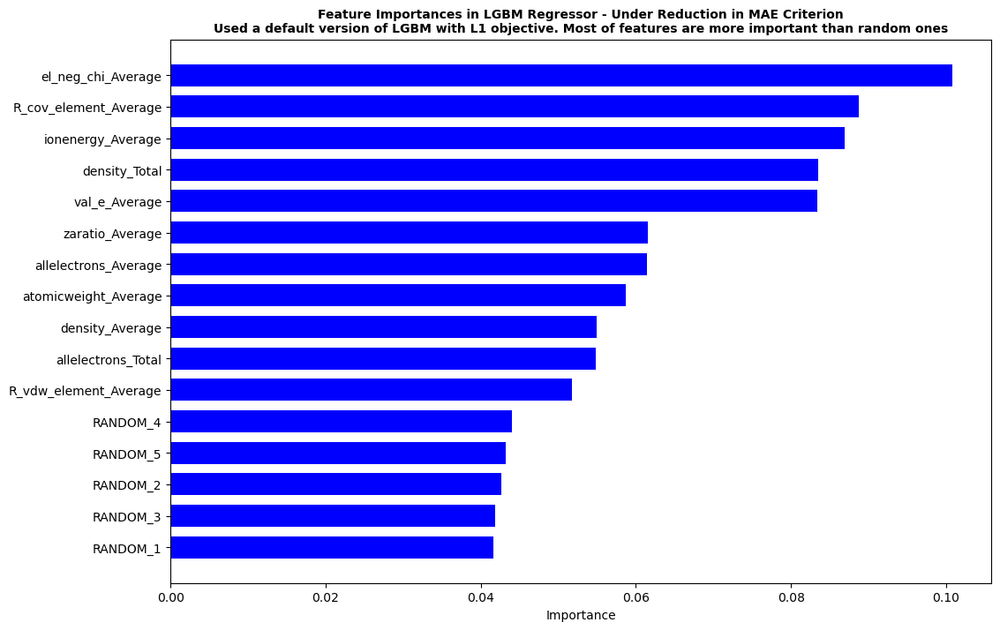

In [46]:
importances = importances.sort_values(by='Importance', ascending=True)

plt.figure(figsize=(12, 8)) 
plt.barh(importances['Feature'], importances['Importance'], color='b', height=0.7)

plt.title("Feature Importances in LGBM Regressor - Under Reduction in MAE Criterion\n"
          "Used a default version of LGBM with L1 objective. "
          "Most of features are more important than random ones", fontsize=10, weight='bold')
plt.xlabel('Importance')
plt.ylabel('')
plt.show()


In [47]:
from collections import defaultdict
from sklearn.metrics import median_absolute_error

In [48]:
np.random.seed(42)
seeds = np.random.randint(0, 19937, size=5)

lgbm = DefaultLGBMRegressor()
permutation_medae = defaultdict(list)

for seed in seeds:
    np.random.seed(seed)
    X["RANDOM_1"] = np.random.normal(size=len(X))
    X["RANDOM_2"] = np.random.normal(size=len(X))
    X["RANDOM_3"] = np.random.normal(size=len(X))
    X["RANDOM_4"] = np.random.normal(size=len(X))
    X["RANDOM_5"] = np.random.normal(size=len(X))

    kfold = KFold(n_splits=5, shuffle=True, random_state=seed)
    lgbm.set_params(random_state=seed)

    for k, (train_ids, valid_ids) in enumerate(kfold.split(X, y)):
        X_train, y_train = X.iloc[train_ids], y[train_ids]  # type: ignore
        X_valid, y_valid = X.iloc[valid_ids], y[valid_ids]  # type: ignore

        lgbm.fit(X_train, y_train)
        medae = median_absolute_error(y_valid, lgbm.predict(X_valid))  # type: ignore

        for i, feature in enumerate(X_train.columns):
            X_shuffled = X_valid.copy()
            X_shuffled.iloc[:, i] = np.random.permutation(X_shuffled.iloc[:, i])
            medae_shuffled = median_absolute_error(y_valid, lgbm.predict(X_shuffled))  # type: ignore
            # I assume an increase in MedAE if the attribute is essential.
            permutation_medae[feature].append(((medae_shuffled - medae) / medae) * 100.0)

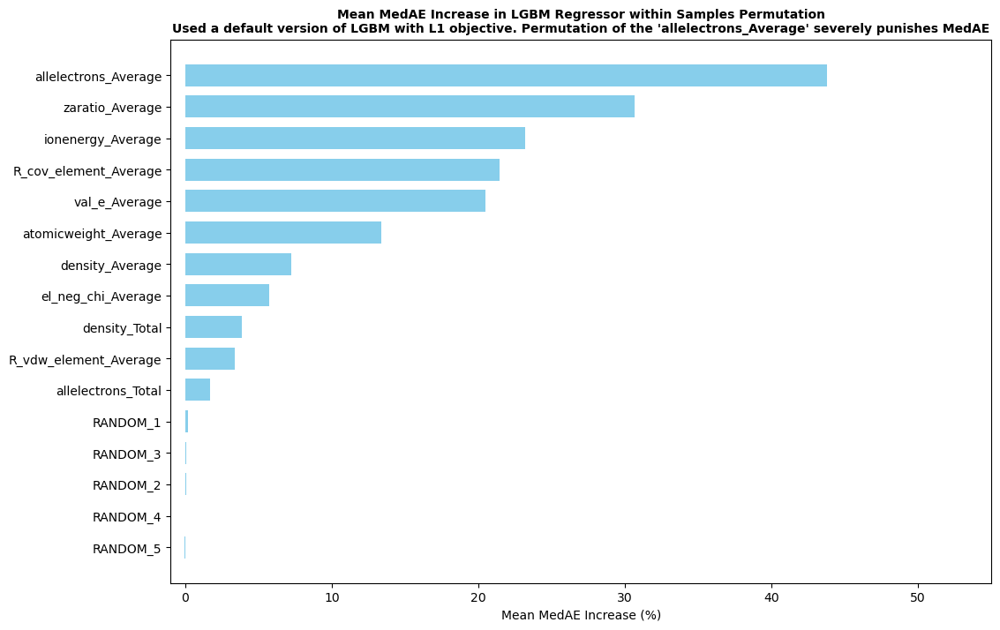

In [49]:
medae_increase = (
    pd.DataFrame(permutation_medae)
    .mean()
    .sort_values(ascending=False)
    .to_frame(name="Mean MedAE Increase (%)")
    .reset_index(names="Feature")
)


# Plotting
plt.figure(figsize=(12, 8))  # Width: 12, Height: 8
plt.barh(medae_increase['Feature'], medae_increase['Mean MedAE Increase (%)'], color='skyblue', height=0.7)

# Adding titles and labels
plt.title("Mean MedAE Increase in LGBM Regressor within Samples Permutation\n"
          "Used a default version of LGBM with L1 objective. "
          "Permutation of the 'allelectrons_Average' severely punishes MedAE",
          fontsize=10, weight='bold')
plt.xlabel('Mean MedAE Increase (%)')
plt.xlim(-1, 55)
plt.ylabel('')

# Invert y-axis to show from most important to least important
plt.gca().invert_yaxis()

# Saving the plot
plt.savefig('importance_with_feature_permutation.png')

# Showing the plot
plt.show()


In [50]:
from sklearn.feature_selection import mutual_info_regression



np.random.seed(42)
seeds = np.random.randint(0, 19937, size=5)

scaler = StandardScaler()
mutual_info = []

for seed in seeds:
    np.random.seed(seed)
    X["RANDOM_1"] = np.random.normal(size=len(X))
    X["RANDOM_2"] = np.random.normal(size=len(X))
    X["RANDOM_3"] = np.random.normal(size=len(X))
    X["RANDOM_4"] = np.random.normal(size=len(X))
    X["RANDOM_5"] = np.random.normal(size=len(X))

    # Choose of neighbors is subjective.
    mi = mutual_info_regression(X=scaler.fit_transform(X), y=y, n_neighbors=50, random_state=seed)
    mutual_info.append(mi)

mi_importances = (
    pd.DataFrame({"Feature": X.columns, "Mutual Information": np.array(mutual_info).mean(axis=0)})
    .sort_values(by="Mutual Information", ascending=False)
    .reset_index(drop=True)
)

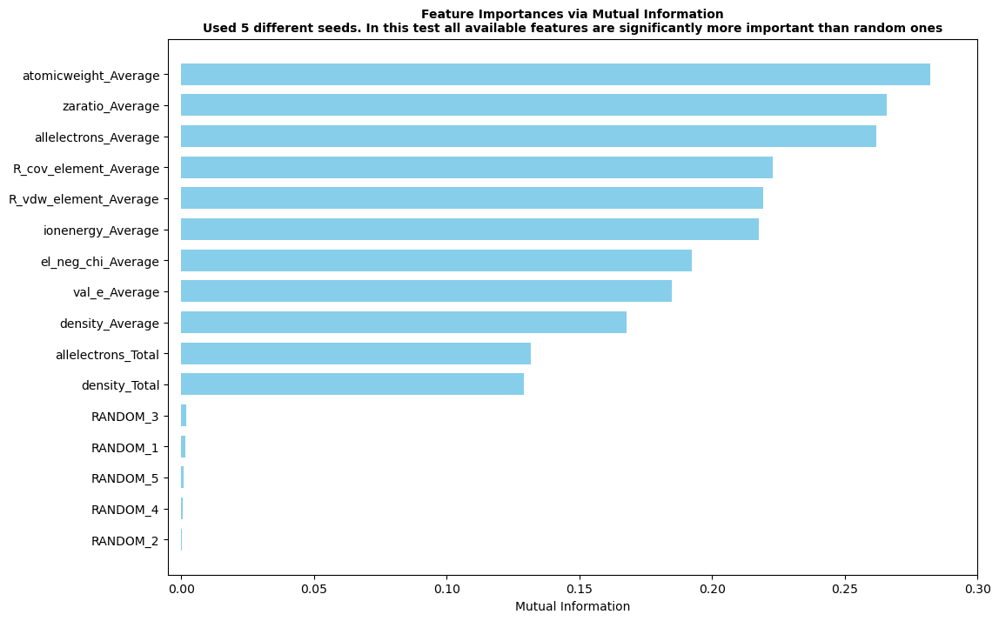

In [51]:
plt.figure(figsize=(12, 8))  # عرض: 12، ارتفاع: 8

# رسم نمودار میله‌ای افقی
plt.barh(mi_importances['Feature'], mi_importances['Mutual Information'], color='skyblue', height=0.7)

# افزودن عناوین و برچسب‌ها
plt.title("Feature Importances via Mutual Information\n"
          "Used 5 different seeds. In this test all available features "
          "are significantly more important than random ones",
          fontsize=10, weight='bold')
plt.xlabel('Mutual Information')
plt.xlim(-0.005, 0.3)
plt.ylabel('')

# معکوس کردن محور y برای نمایش از زیاد به کم
plt.gca().invert_yaxis()

# ذخیره نمودار
plt.savefig('mutual_information.png')

# نمایش نمودار
plt.show()


In [52]:
from sklearn.preprocessing import MinMaxScaler, PowerTransformer, RobustScaler
from sklearn.decomposition import PCA, TruncatedSVD
from sklearn.manifold import TSNE, Isomap, LocallyLinearEmbedding

In [53]:
X = df.drop({"Hardness","dataset"}, axis=1)
y = df.Hardness

transformer = PowerTransformer(method="yeo-johnson", standardize=True)
X_rescaled = transformer.fit_transform(X)

pca_2d = PCA(n_components=2, random_state=42)
iso_2d = Isomap(n_components=2, n_neighbors=20, n_jobs=-1)
tsne_2d = TSNE(n_components=2, random_state=42, n_jobs=-1)

pca_2d_results = pd.DataFrame(pca_2d.fit_transform(X_rescaled), columns=("x1", "x2")).join(y)
iso_2d_results = pd.DataFrame(iso_2d.fit_transform(X_rescaled), columns=("x1", "x2")).join(y)
tsne_2d_results = pd.DataFrame(tsne_2d.fit_transform(X_rescaled), columns=("x1", "x2")).join(y)

In [54]:
from itertools import product

In [55]:
def get_n_rows_and_axes(n_features, n_cols, /, start_at=1):
    n_rows = int(np.ceil(n_features / n_cols))
    current_col = range(start_at, n_cols + start_at)
    current_row = range(start_at, n_rows + start_at)
    return n_rows, tuple(product(current_row, current_col))

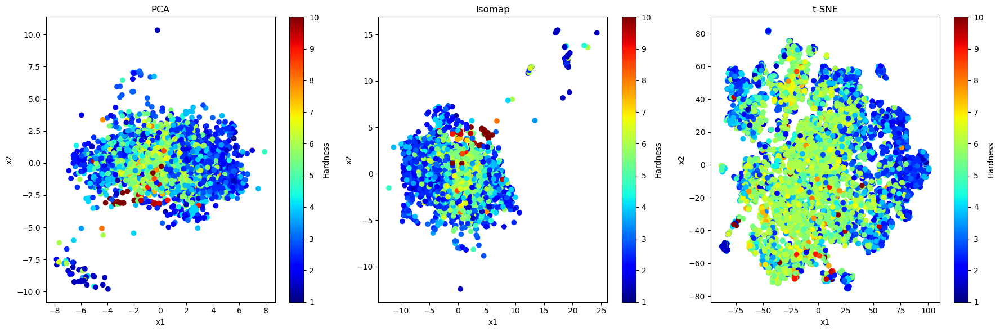

In [56]:
import matplotlib.pyplot as plt

# تعیین سایز نمودار
plt.figure(figsize=(18, 6))

# نمودار PCA
plt.subplot(1, 3, 1)
plt.scatter(pca_2d_results['x1'], pca_2d_results['x2'], c=pca_2d_results['Hardness'], cmap='jet')
plt.title('PCA')
plt.colorbar(label='Hardness')
plt.xlabel('x1')
plt.ylabel('x2')

# نمودار Isomap
plt.subplot(1, 3, 2)
plt.scatter(iso_2d_results['x1'], iso_2d_results['x2'], c=iso_2d_results['Hardness'], cmap='jet')
plt.title('Isomap')
plt.colorbar(label='Hardness')
plt.xlabel('x1')
plt.ylabel('x2')

# نمودار t-SNE
plt.subplot(1, 3, 3)
plt.scatter(tsne_2d_results['x1'], tsne_2d_results['x2'], c=tsne_2d_results['Hardness'], cmap='jet')
plt.title('t-SNE')
plt.colorbar(label='Hardness')
plt.xlabel('x1')
plt.ylabel('x2')

plt.tight_layout()
plt.show()


Dimensionality Reduction Results 📜

As we can see, PCA and Isomap produce kind similar outcomes.
On the other hand, t-SNE creates a pretty cool low-dimensional visual.
Let's get one step further and use t-SNE to create a 3D projection.

In [57]:
tsne_3d = TSNE(n_components=3, random_state=42, n_jobs=-1)
tsne_3d_results = pd.DataFrame(tsne_3d.fit_transform(X_rescaled), columns=("x1", "x2", "x3")).join(y)

fig = px.scatter_3d(
    tsne_3d_results,
    x="x1",
    y="x2",
    z="x3",
    color="Hardness",
    opacity=0.5,
    height=840,
    width=840,
    title="Training Dataset - 3D Projection with t-SNE<br>"
    "<span style='font-size: 75%; font-weight: bold;'>"
    "Many samples overlap but these with low 'Hardness' seems to "
    "be separated pretty well</span>",
)
fig.update_traces(marker_size=2)
fig.update_coloraxes(colorbar=dict(ticklabelposition="outside bottom"))
fig.show()

Dimensionality Reduction with t-SNE 📜

So, here we see that t-SNE tried to separate samples with different Hardness value levels.
For example, there is an area that is dominated by samples with low Hardness. Well, 
dimensionality reduction is a nice tool but in this specific problem samples seems to be difficult to separate them clearly


In [58]:
def remove_outliers(data, detector):
    if not isinstance(data, pd.DataFrame):
        raise TypeError(f"'data' must be {pd.DataFrame!r} instance")

    result = detector.fit_predict(data)
    outlier_ids = pd.Series(result == -1, index=data.index, dtype=bool)
    data_ids = pd.Series(np.ones_like(data.index), index=data.index, dtype=bool)
    
    return data[~(outlier_ids & data_ids)]

In [59]:
from sklearn.neighbors import LocalOutlierFactor


این کد یک مدل رگرسیون با استفاده از LGBM (LightGBM) را با استفاده از مدل پیش‌فرض DefaultLGBMRegressor تعریف می‌کند. سپس از روش اعتبارسنجی متقاطع K-Fold برای تقسیم داده‌ها به ۵ بخش (fold) استفاده می‌کند.

برای هر یک از ۵ fold، مدل LGBM روی داده‌های آموزشی برازش می‌شود و سپس عملکرد آن روی داده‌های اعتبارسنجی با استفاده از معیار Median Absolute Error (MEDAE) اندازه‌گیری می‌شود.

در هر iteratation از این fold، برای مقادیر مختلفی از hyperparameter مرتبط با LocalOutlierFactor که با نام localoutlierfactor__contamination مشخص شده است، عملکرد مدل بدون توجه به outlierها اندازه‌گیری می‌شود. این مقادیر از ۰.۰۱ تا ۰.۱۴ با اندازه‌گیری‌های ۰.۰۱ گامی تعیین شده‌اند.

سپس با حذف نقاط خارجی از داده‌های آموزشی با استفاده از مدل LocalOutlierFactor و مقدار داده‌شده به عنوان hyperparameter، مدل LGBM مجدداً بر روی داده‌های بدون نقاط خارجی برازش می‌شود و عملکرد آن روی داده‌های اعتبارسنجی اندازه‌گیری می‌شود.

نتایج اندازه‌گیری MEDAE برای هر یک از hyperparameter values به همراه شماره‌ی fold ذخیره می‌شود.

In [60]:
lgbm = DefaultLGBMRegressor()
kfold = KFold(n_splits=5, shuffle=True, random_state=42)
detector = make_pipeline(
    PowerTransformer(method="yeo-johnson", standardize=True),
    LocalOutlierFactor(),
)

hyperparameter = "localoutlierfactor__contamination"
hyperparameter_values = [None] + np.arange(0.01, 0.15, 0.01).tolist()
no_outliers_medae = {}

for k, (train_ids, valid_ids) in enumerate(kfold.split(X, y), start=1):
    X_train, y_train = X.iloc[train_ids], y.iloc[train_ids]
    X_valid, y_valid = X.iloc[valid_ids], y.iloc[valid_ids]

    lgbm.fit(X_train, y_train)
    default_medae = median_absolute_error(y_valid, lgbm.predict(X_valid))  # type:ignore

    for hp_value in hyperparameter_values:
        if hp_value is None:
            no_outliers_medae[f"0 - {k}"] = default_medae
            continue

        detector.set_params(**{hyperparameter: hp_value})
        X_no_outliers = remove_outliers(X_train, detector)
        y_no_outliers = y_train[X_no_outliers.index]

        lgbm.fit(X_no_outliers, y_no_outliers)
        clean_medae = median_absolute_error(y_valid, lgbm.predict(X_valid))  # type:ignore
        no_outliers_medae[f"{hp_value} - {k}"] = clean_medae

In [61]:
detector_medae = pd.DataFrame({"KEY": no_outliers_medae.keys(), "MedAE": no_outliers_medae.values()})
detector_medae[[hyperparameter, "Fold"]] = detector_medae.KEY.str.split("-", expand=True)
default_medae = detector_medae[detector_medae[hyperparameter].astype(float) == 0].MedAE

fig = px.line(
    detector_medae,
    x=hyperparameter,
    y="MedAE",
    facet_row="Fold",
    facet_row_spacing=0.07,
    height=640,
    width=840,
    title=f"Influence of '{hyperparameter}' Hyperparameter on MedAE in LGBM<br>"
    "<span style='font-size: 75%; font-weight: bold;'>"
    f"None of the '{hyperparameter}' values causes "
    "a reduction in MedAE in all folds</span>",
)
for fold, fold_default_medae in enumerate(default_medae):
    fig.add_hline(
        fold_default_medae,
        annotation_text=f"<b>Default MedAE: {fold_default_medae:.3f}</b>",
        annotation_position="bottom left",
        annotation_font_size=12,
        line_width=1.5,
        opacity=0.75,
        line_dash="dot",
        row=len(default_medae) - fold,  # type:ignore
    )
fig.update_traces(line_width=2)
fig.update_layout(margin_pad=10)
fig.update_xaxes(tickformat=".2f", type="linear")


In [62]:
def clip_numeric_feature(X, lower_bound=None, upper_bound=None):
    X = np.array(X, copy=False)
    return np.clip(X[:, [0]], lower_bound, upper_bound)


def features_interaction(X, op="mul", eps=1e-9):
    ops = {
        "mul": operator.mul,
        "truediv": operator.truediv,
        "add": operator.add,
        "sub": operator.sub,
    }
    X = np.array(X, copy=False)
    return ops.get(op, operator.mul)(X[:, [0]], X[:, [1]] + eps)


def interaction_name(function_transformer, feature_names_in, name):
    return [name]  # feature names out

In [63]:
from sklearn.compose import make_column_transformer
from sklearn.preprocessing import FunctionTransformer


In [64]:
preprocessing = make_pipeline(
    make_column_transformer(
        (
            FunctionTransformer(
                features_interaction,
                feature_names_out=partial(
                    interaction_name, name="allelectrons_atomicweight_avg_mul"
                ),
                kw_args=dict(op="mul"),
            ),
            ["allelectrons_Average", "atomicweight_Average"],
        ),
        (
            FunctionTransformer(
                clip_numeric_feature,
                feature_names_out="one-to-one",
                kw_args=dict(lower_bound=0, upper_bound=1894),
            ),
            ["allelectrons_Total"],
        ),
        (
            FunctionTransformer(
                clip_numeric_feature,
                feature_names_out="one-to-one",
                kw_args=dict(lower_bound=0, upper_bound=236),
            ),
            ["density_Total"],
        ),
        remainder="passthrough",
        verbose_feature_names_out=True,
    ),
    PowerTransformer(method="yeo-johnson", standardize=True),
    # FeatureAgglomeration(n_clusters=3, linkage="complete"),
)